In [49]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import robotdatapy as rdp # 1.0.3

# scipy rotation matrix
import scipy as sp

In [66]:
# plt.style.use('/home/masonbp/computer/python/matplotlib/publication.mplstyle')
SAVE = True
QUICK = False
ADD_ANNOTATIONS = True

# quicker
if QUICK:
    num_pcs = 100
    num_markers = 500
else:
    num_pcs = 1000
    num_markers = 3000


In [67]:
def get_pc(bag_path, topic):
    pcd = rdp.data.PointCloudData.from_bag(
        path=bag_path,
        topic=topic,
    )

    marker_data = rdp.data.GeneralData.from_bag(
        path=bag_path,
        topic="/NX01/actual_traj",
        ros_distro='humble',
        time_tol=30.0,
        causal=False
    )

    pc = pcd.pointcloud(pcd.t0).get_xyz()
    pc_frame = pcd.msg_header(pcd.t0).frame_id
    print("pc_frame:", pc_frame)

    pd = rdp.data.PoseData.from_bag_tf(bag_path,
                                    parent_frame="map", child_frame=pc_frame,
                                    time_tol=5.0)

    pc = rdp.transform.transform(pd.pose(pcd.tf), pcd.pointcloud(pcd.tf).get_xyz())
    return pc, pcd, pd, marker_data

def apply_transform(points):
    T_side_view = rdp.transform.xyz_rpy_to_transform([0., 0., 0.], [-50., -0., 0.], degrees=True) @ \
        rdp.transform.xyz_rpy_to_transform([0., 0., 0.,], [0., 0., -30.], degrees=True)
    # T_side_view = np.eye(4)

    # degrees to rotation matrix
    roll = 180
    pitch = 0
    yaw = 0

    rotation_matrix = sp.spatial.transform.Rotation.from_euler('xyz', [roll, pitch, yaw], degrees=True).as_matrix()
    T_world_cam = np.array([
        [1., 0., 0., 60.,],
        [0., -1., 0., 0.,],
        [0., 0., -1., 175.,],
        [0., 0., 0., 1.,]
    ])

    K = np.array([[300, 0., 0.], [0., 300, 0.], [0., 0., 1.]])

    points_cam = rdp.transform.transform(np.linalg.inv(T_world_cam) @ T_side_view, points)
    points_cam = points_cam[points_cam[:,2] > 0.1]
    points_side_view = rdp.camera.xyz_2_pixel(points_cam, K)
    return points_side_view

In [70]:
def plot_pc(pc, pcd, pd, marker_data, bag_path, figure_name):
    plt.style.use('dark_background')
    t = np.linspace(pcd.t0, pcd.tf, num_pcs)

    pcs = []
    for ti in t:
        if len(pcd.pointcloud(ti).get_xyz()) == 0:
            continue
        pc = rdp.transform.transform(pd.pose(ti), pcd.pointcloud(ti).get_xyz())
        pcs.append(pc)
        # ax.plot(pc[:,0], pc[:,1], '.', markersize=0.1, alpha=0.2, color='xkcd:aqua')

    pc = np.vstack(pcs)

    marker_xyz = []
    marker_colors = []
    for ti in np.linspace(marker_data.t0, marker_data.tf, num_markers):
        position_ros = marker_data.data(ti).pose.position
        color_ros = marker_data.data(ti).color
        mi = np.array([position_ros.x, position_ros.y, position_ros.z])
        marker_xyz.append(rdp.transform.transform(pd.pose(ti), mi))
        marker_colors.append([color_ros.r, color_ros.g, color_ros.b])
    marker_xyz = np.array(marker_xyz)
    marker_colors = np.array(marker_colors)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10,10), dpi=500)

    # Plot marker data with its corresponding colors
    for i in range(marker_xyz.shape[0]):
        ax.plot(marker_xyz[i,0], marker_xyz[i,1], '.', markersize=1.0, alpha=1.0, color=marker_colors[i])

    # Plot the aggregated point cloud in a light color
    ax.plot(pc[:,0], pc[:,1], '.', markersize=0.15, alpha=0.1, color='xkcd:white')

    # --- Compute and add an accurate 10 m scale bar ---
    # Compute the bounding box of the point cloud data (assumed to be in meters)
    x_min, x_max = np.min(pc[:,0]), np.max(pc[:,0])
    y_min, y_max = np.min(pc[:,1]), np.max(pc[:,1])

    # Define a padding (5% of axis range) so the scale bar is not flush with the plot edge
    x_pad = 0.05 * (x_max - x_min)
    y_pad = 0.05 * (y_max - y_min)

    # Set the start and end positions for the scale bar in data coordinates
    x_scale_start = x_min + x_pad
    # x_scale_start = marker_xyz[0,0]
    x_scale_end = x_scale_start + 10.0  # 10 meters
    y_scale = y_max - y_pad

    # Draw the horizontal scale bar
    ax.plot([x_scale_start, x_scale_end], [y_scale, y_scale], color='white', linewidth=1.5)
    # Draw vertical ticks at the scale bar endpoints
    ax.plot([x_scale_start, x_scale_start], [y_scale - 0.5, y_scale + 0.5], color='white', linewidth=0.5)
    ax.plot([x_scale_end, x_scale_end], [y_scale - 0.5, y_scale + 0.5], color='white', linewidth=0.5)
    # Label the scale bar
    ax.text(x_scale_start + 10.0/4, y_scale - 2.5, '10 m', color='white', fontsize=16)

    # Set equal aspect ratio and turn off axis
    ax.set_aspect('equal')
    ax.axis('off')

    # --- Optional annotations ---
    if ADD_ANNOTATIONS:
        markersize = 10.0
        bbox_props = dict(facecolor='white', boxstyle='round,pad=0.1')
        # Plot start and goal markers
        ax.plot([marker_xyz[0,0]], [marker_xyz[0,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:red')
        ax.plot([marker_xyz[-1,0]], [marker_xyz[-1,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:blue')
        # Label start and goal
        ax.text(marker_xyz[0,0] - 2.5, marker_xyz[0,1] + 3, 'Start', color='red', fontsize=16, bbox=bbox_props)
        ax.text(marker_xyz[-1,0] - 2.5, marker_xyz[-1,1] + 3, 'Goal', color='blue', fontsize=16, bbox=bbox_props)

    # Save the figure if required
    if SAVE:
        # folder path is one level up from the bag path
        folder_path = bag_path[:bag_path.rfind('/')]
        plt.savefig(folder_path + figure_name, bbox_inches='tight')

    return pc, marker_xyz, marker_colors

def plot_with_angle(pc, marker_xyz, marker_colors, bag_path, figure_name):

    pc_side_view = apply_transform(pc)
    marker_xyz_side_view = apply_transform(marker_xyz)

    fig, ax = plt.subplots(figsize=(10,10), dpi=500)
    for i in range(0, marker_xyz_side_view.shape[0]):
        ax.plot(marker_xyz_side_view[i,0], -marker_xyz_side_view[i,1], '.', markersize=1.0, alpha=1.0, color=marker_colors[i])
    ax.plot(pc_side_view[:,0], -pc_side_view[:,1], '.', markersize=0.15, alpha=0.1, color='xkcd:white')
    ax.set_aspect('equal')
    ax.axis('off')

    if ADD_ANNOTATIONS:
        markersize = 20.0
        bbox = bbox=dict(facecolor='white', boxstyle='round,pad=0.1')
        ax.plot([marker_xyz_side_view[0,0]], [-marker_xyz_side_view[0,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:red')
        ax.plot([marker_xyz_side_view[-1,0]], [-marker_xyz_side_view[-1,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:blue')
        ax.text(marker_xyz_side_view[0,0] - 3, -marker_xyz_side_view[0,1] - 8, 'Start', color='red', fontsize=16, bbox=bbox)
        ax.text(marker_xyz_side_view[-1,0] - 3, -marker_xyz_side_view[-1,1] + 5, 'Goal', color='blue', fontsize=16, bbox=bbox)

    if SAVE:
        # folder path is one level up from the bag path
        folder_path = bag_path[:bag_path.rfind('/')]
        plt.savefig(folder_path + figure_name, bbox_inches='tight')

pc_frame: NX01/NX01_livox


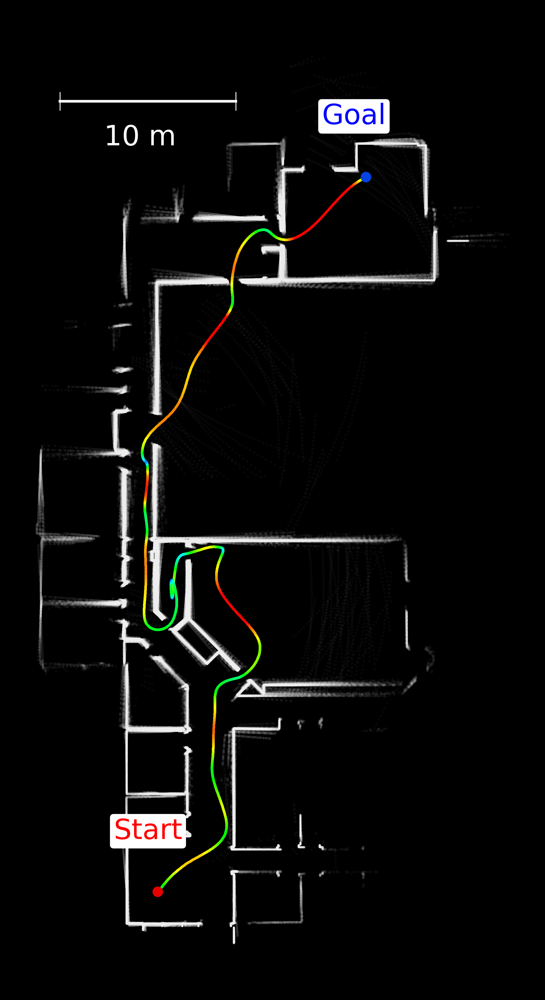

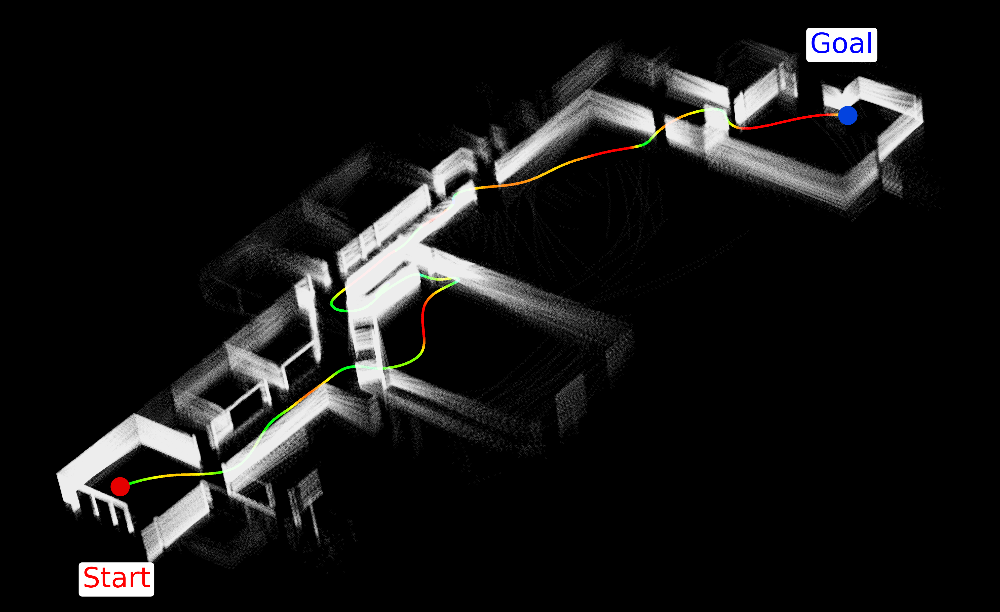

In [71]:
# plot the point cloud data
topic = "/NX01/mid360_PointCloud2"

bag_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case1/rosbag2_2025_03_25-20_28_23"
pc, pcd, pd, marker_data = get_pc(bag_path, topic)
pc, marker_xyz, marker_colors = plot_pc(pc, pcd, pd, marker_data, bag_path, "/office_case1_overhead_pc.png")
plot_with_angle(pc, marker_xyz, marker_colors, bag_path, "/office_case1_side_view_pc.png")

bag_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case2/rosbag2_2025_03_25-20_47_02"
pc, pcd, pd, marker_data = get_pc(bag_path, topic)
pc, marker_xyz, marker_colors = plot_pc(pc, pcd, pd, marker_data, bag_path, "/office_case2_overhead_pc.png")
plot_with_angle(pc, marker_xyz, marker_colors, bag_path, "/office_case2_side_view_pc.png")

bag_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case3/rosbag2_2025_03_25-20_51_41"
pc, pcd, pd, marker_data = get_pc(bag_path, topic)
pc, marker_xyz, marker_colors = plot_pc(pc, pcd, pd, marker_data, bag_path, "/office_case3_overhead_pc.png")
plot_with_angle(pc, marker_xyz, marker_colors, bag_path, "/office_case3_side_view_pc.png")


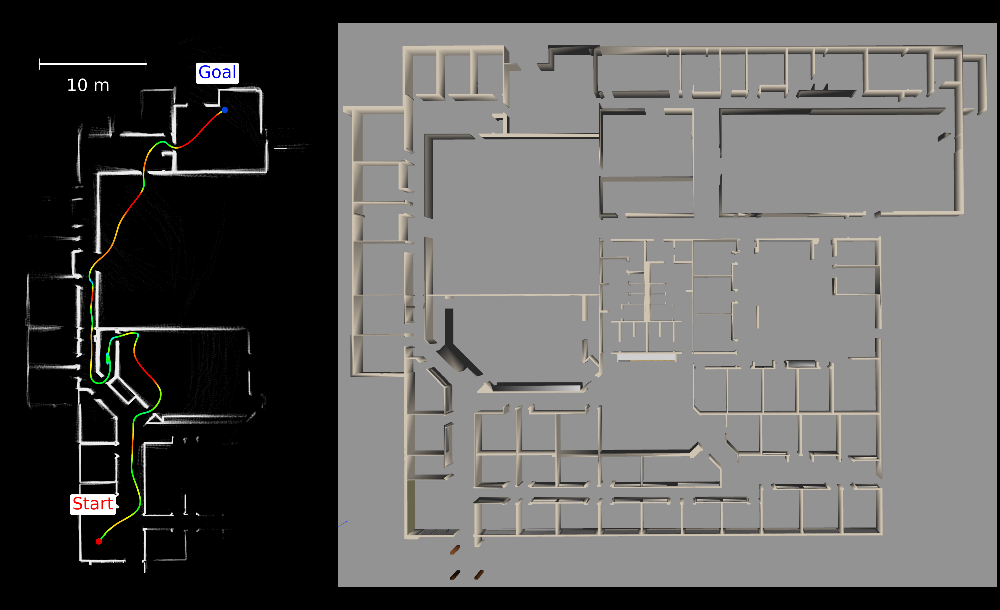

In [77]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Load images
folder_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/"
overhead_image = plt.imread(folder_path + '/case1/office_case1_overhead_pc.png')
gazebo_image = plt.imread(folder_path + '/office_gazebo.png')

# Define the cropping region for the gazebo image (adjust as needed)
# Create a figure with GridSpec layout
fig_size_x = 30
fig_size_y = fig_size_x / 1.618  # Golden ratio
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
# Adjust width_ratios to make the right column (gazebo and camera) smaller
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 2])

# Top-left: Overhead image (large)
ax_overhead = fig.add_subplot(gs[0, 0])
ax_overhead.imshow(overhead_image)
ax_overhead.axis('off')

# Top-right: Gazebo image (smaller)
ax_gazebo = fig.add_subplot(gs[0, 1])
ax_gazebo.imshow(gazebo_image)
ax_gazebo.axis('off')

plt.tight_layout()
# plt.show()

# save the figure
if SAVE:
    # plt.savefig(folder_path + '/high_res_forest_combined.png', bbox_inches='tight')
    plt.savefig("/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case1/case1_combined.png", bbox_inches='tight')
    plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/sim/office/case1_combined.png", bbox_inches='tight')

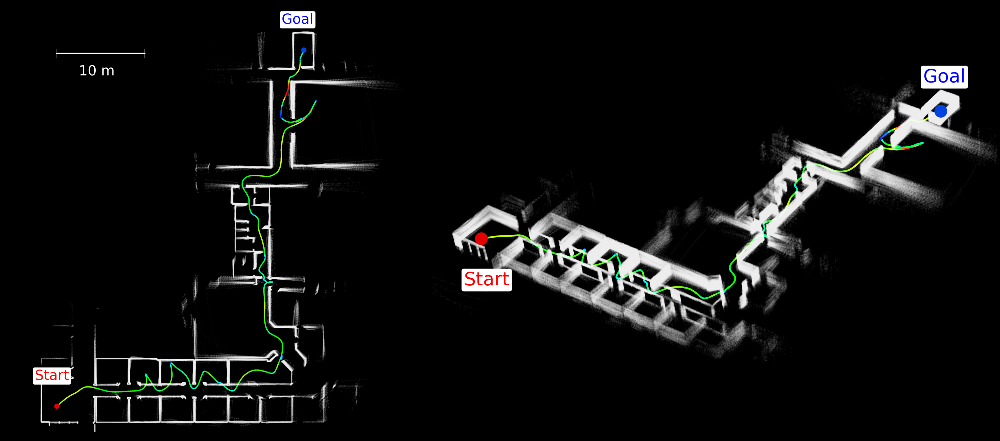

In [3]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.style.use('dark_background')
# Load images
folder_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/"
overhead_image = plt.imread(folder_path + '/case2/office_case2_overhead_pc.png')
side_view_image = plt.imread(folder_path + '/case2/office_case2_side_view_pc.png')

# crop the image
overhead_image = overhead_image[0:overhead_image.shape[0] - 500, 0:overhead_image.shape[1]]
side_view_image = side_view_image[0:side_view_image.shape[0] - 10, 300:side_view_image.shape[1] - 300]

# Define the cropping region for the gazebo image (adjust as needed)
# Create a figure with GridSpec layout
fig_size_x = 30
fig_size_y = fig_size_x / 1.618  # Golden ratio
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
# Adjust width_ratios to make the right column (gazebo and camera) smaller
gs = gridspec.GridSpec(1, 2, width_ratios=[1.5, 2])

# Top-left: Overhead image (large)
ax_overhead = fig.add_subplot(gs[0, 0])
ax_overhead.imshow(overhead_image)
ax_overhead.axis('off')

# Top-right: side view image (smaller)
ax_side_view = fig.add_subplot(gs[0, 1])
ax_side_view.imshow(side_view_image)
ax_side_view.axis('off')

plt.tight_layout()
# plt.show()

# save the figure
# if SAVE:
plt.savefig("/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case2/case2_combined.png", bbox_inches='tight')
    # plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/sim/office/case2_combined.png", bbox_inches='tight')


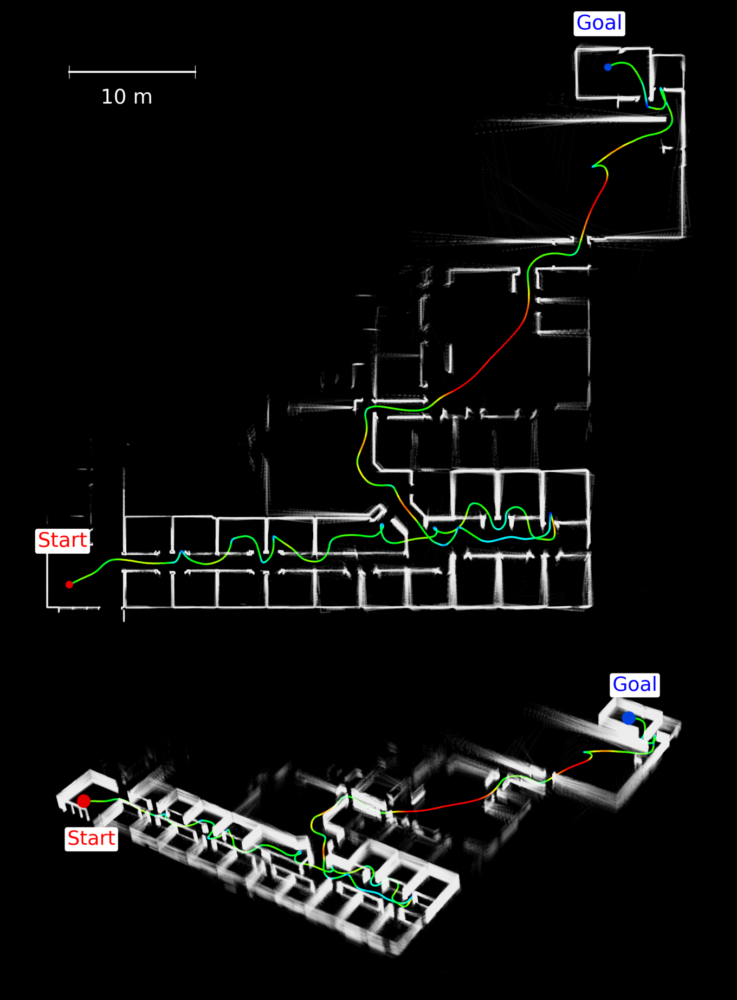

In [79]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Load images
folder_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/"
overhead_image = plt.imread(folder_path + '/case3/office_case3_overhead_pc.png')
side_view_image = plt.imread(folder_path + '/case3/office_case3_side_view_pc.png')

# Define the cropping region for the gazebo image (adjust as needed)
# Create a figure with GridSpec layout
fig_size_x = 30
fig_size_y = fig_size_x / 1.618  # Golden ratio
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
# Adjust width_ratios to make the right column (gazebo and camera) smaller
gs = gridspec.GridSpec(2, 1, height_ratios=[2, 1])

# Top-left: Overhead image (large)
ax_overhead = fig.add_subplot(gs[0, 0])
ax_overhead.imshow(overhead_image)
ax_overhead.axis('off')

# Top-right: side view image (smaller)
ax_side_view = fig.add_subplot(gs[1, 0])
ax_side_view.imshow(side_view_image)
ax_side_view.axis('off')

plt.tight_layout()
# plt.show()

# save the figure
if SAVE:
    plt.savefig("/media/kkondo/T7/dynus/tro_paper/single_agent_performance/office/case3/case3_combined.png", bbox_inches='tight')
    plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/sim/office/case3_combined.png", bbox_inches='tight')